In [1]:
import hedonic_price_model.feature_engineering as fen
import hedonic_price_model.modeling as hpmm
from spreg import OLS, ML_Lag, ML_Error
import geopandas as gpd
import numpy as np
import libpysal
from esda.moran import Moran, Moran_Local
from mgwr.gwr import GWR, GWRResults
from mgwr.sel_bw import Sel_BW
import matplotlib.pyplot as plt
from splot.esda import moran_scatterplot, plot_local_autocorrelation
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV
import random
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

random.seed(10)

In [2]:
# import properties and venues data
gdf = gpd.read_file('../database/properties.gpkg')
gdf_venues = gpd.read_file('../database/venues.gpkg')
gdf_neighborhoods = gpd.read_file('../database/neighborhoods.gpkg')

# change CRS for meters
gdf = gdf.to_crs(epsg=32614)
gdf_venues = gdf_venues.to_crs(epsg=32614)
gdf_neighborhoods = gdf_neighborhoods.to_crs(epsg=32614)

# Remove extra hospitals
gdf_venues = gdf_venues[~((gdf_venues['category'] == 'hospital') & (gdf_venues['source'] == 'FourSquare'))]

In [3]:
# filtering categories
# print(gdf_venues.category.value_counts())
cats_keep = [
    'public transport', 'park', 'gym', 'convenience store', 'workout studio',
    'drugstore', 'super market', 'liquor store', 'mall', 'woods', 'hospital',
    'education'
    ]
all_venues = gdf_venues[
        gdf_venues['category'].isin(cats_keep)
    ]

# Fix venues
all_venues.loc[all_venues['category']=='public transport', 'category'] =  all_venues.loc[all_venues['category']=='public transport', 'subcategory']
all_venues.loc[all_venues['category']=='education', 'category'] =  all_venues.loc[all_venues['category']=='education', 'subcategory']
all_venues.loc[all_venues['subcategory']=='wholesale store', 'category'] =  'wholesale store'
all_venues.loc[all_venues['name']=='Abarrotes', 'category'] =  'abarrotes'

In [4]:
# get all venue caetgories
venues = list(all_venues['category'].unique())

# nearest venue
gdf = fen.distance_to_nearest_venue(
    properties_gdf=gdf,
    venues_gdf=all_venues[all_venues['category'].isin(venues)],
    category_col='category'
    )

# venues within range 500m
gdf = fen.count_within_range(
    properties_gdf=gdf,
    venues_gdf=all_venues[all_venues['category'].isin(venues)],
    buffers= [500],
    category_col='category'
    )

# venues within range 1km
gdf = fen.count_within_range(
    properties_gdf=gdf,
    venues_gdf=all_venues[all_venues['category'].isin(venues)],
    buffers= [1000],
    category_col='category'
    )

# closeness to concentration points
gdf = fen.calculate_kde(
    properties_gdf=gdf,
    venues_gdf=all_venues[all_venues['category'].isin(venues)],
    bandwidths=[1000],
    category_col='category',
)

In [5]:
predictors = [
    'bedrooms', 'parking_spaces','full_bathroom',
    'half_bathroom', 'property_age', # 'gated_community',
    'type_Appartment', #'type_House'
    ]
X_cols = {key:[col for col in gdf.columns if key in col] for key in ['within_500', 'within_1000', 'dist', 'kde_']}

In [6]:
# Econometric models
cv_results = []
y = gdf['price_per_m2']
coords = np.vstack([gdf.centroid.x, gdf.centroid.y]).T

for dist_metric, dist_cols in X_cols.items():
    print(f'{"==="} {dist_metric} {'='*10}')
    X = gdf[predictors + dist_cols]
    res = hpmm.spatial_cv_econometric_models(y, X, coords, std_dev=False)
    res['Distance Metric'] = dist_metric
    cv_results.append(res)

cv_comp2 = pd.concat(cv_results, ignore_index=True)

=== within_500 ==========


=== within_1000 ==========


=== dist ==========
=== kde_ ==========


In [7]:
# XGBoost
cv_results = []
y = gdf['price_per_m2']
coords = np.vstack([gdf.centroid.x, gdf.centroid.y]).T

for dist_metric, dist_cols in X_cols.items():
    print(f'{"==="} {dist_metric} {'='*10}')
    X = gdf[predictors + dist_cols + ['lat', 'lon']]
    res = hpmm.spatial_cv_xgboost(y, X, coords, std_dev=False)
    res['Distance Metric'] = dist_metric
    cv_results.append(res)

cv_comp = pd.concat(cv_results, ignore_index=True)

=== within_500 ==========
=== within_1000 ==========
=== dist ==========
=== kde_ ==========


In [8]:
cv_comp = pd.concat([cv_comp, cv_comp2], ignore_index=True)
print(cv_comp[['Model', 'Distance Metric', 'RMSE', 'MAE', 'R²']].to_markdown(index=False))

| Model   | Distance Metric   |    RMSE |      MAE |       R² |
|:--------|:------------------|--------:|---------:|---------:|
| XGBoost | within_500        | 12803.5 | 10024.4  | 0.325137 |
| XGBoost | within_1000       | 12978.3 |  9980.04 | 0.31935  |
| XGBoost | dist              | 14004.4 | 11023.8  | 0.211485 |
| XGBoost | kde_              | 14773.9 | 11573.2  | 0.129424 |
| OLS     | within_500        | 15641.7 | 12257.1  | 0.478004 |
| SLM     | within_500        | 15024.6 | 11630.3  | 0.615746 |
| SEM     | within_500        | 15717.9 | 12526.4  | 0.420292 |
| OLS     | within_1000       | 14601.9 | 11218    | 0.533955 |
| SLM     | within_1000       | 14608.7 | 11190    | 0.625815 |
| SEM     | within_1000       | 14732.5 | 11335.1  | 0.505648 |
| OLS     | dist              | 14262.1 | 11067.9  | 0.560143 |
| SLM     | dist              | 13865.4 | 10721    | 0.628845 |
| SEM     | dist              | 14755.2 | 11550    | 0.544678 |
| OLS     | kde_              | 14541.8 

In [9]:
import shap
shap_values = {}
final_models = {}
y = gdf['price_per_m2']
coords = np.vstack([gdf.centroid.x, gdf.centroid.y]).T

for dist_metric, dist_cols in X_cols.items():
    print(f'{"==="} {dist_metric} {'='*10}')
    X = gdf[predictors + dist_cols + ['lat', 'lon']]
    ols, slm, sem, xgb = hpmm.fit_all_models(y,X,coords)
    
    if False:  # Change to True to get SHAP feature importance info
        explainer = shap.TreeExplainer(xgb)
        shap_values = explainer.shap_values(X)
        plt.figure(figsize=(10, 8))
        shap.summary_plot(shap_values, X, plot_type='bar', show=False, max_display=15)
        plt.title(f"Global Feature Importance - XGBoost Model ({dist_metric})")
        plt.tight_layout()
        plt.show()

        feature_names = X.columns
        shap_importance = np.abs(shap_values).mean(0)
        feature_importance_df = pd.DataFrame({
            'feature': feature_names,
            'shap_importance': shap_importance
        }).sort_values('shap_importance', ascending=False)

        print(f"Top 10 Most Important Features ({dist_metric}):")
        print(feature_importance_df.head(15))
    
    final_models[f'OLS_{dist_metric}'] = ols
    final_models[f'SLM_{dist_metric}'] = slm
    final_models[f'SEM_{dist_metric}'] = sem
    final_models[f'XGB_{dist_metric}'] = xgb
    # final_models[f'GWR_{dist_metric}'] = gwr

=== within_500 ==========
{'subsample': 0.8, 'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.01, 'colsample_bytree': 0.8}
=== within_1000 ==========
{'subsample': 0.8, 'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.01, 'colsample_bytree': 0.8}
=== dist ==========
{'subsample': 0.8, 'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.01, 'colsample_bytree': 0.8}
=== kde_ ==========
{'subsample': 0.8, 'n_estimators': 300, 'max_depth': 9, 'learning_rate': 0.01, 'colsample_bytree': 0.8}


In [10]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error

gwr_results = {'Model':[], 'Distance Metric':[], 'RMSE':[], 'MAE':[], 'R²':[]}
for dist_metric, dist_cols in X_cols.items():
    y_gwr = gdf['price_per_m2'].values.reshape(-1, 1)
    X_gwr = np.asarray(gdf[predictors + dist_cols])

    bw_selector = Sel_BW(  
        coords, y_gwr, X_gwr,  
        fixed=False,             # Adaptive bandwidth  
        kernel='gaussian',       # Gaussian kernel  
        # spherical=True           # Use if coordinates are lat/lon  
    )
    bw_adaptive = bw_selector.search()

    gwr_model = GWR(  
        coords, y_gwr, X_gwr,  
        bw=bw_adaptive,          # Use selected bandwidth  
        fixed=False,              # Consistent with Sel_BW  
        kernel='gaussian',
        name_x=predictors + dist_cols       # Explicit kernel specification  
        # spherical=True            # Match coordinate system  
    ).fit()
    y_pred = gwr_model.predy

    final_models[f'GWR_{dist_metric}'] = gwr_model
    gwr_results['Model'].append('GWR')
    gwr_results['Distance Metric'].append(dist_metric)
    gwr_results['RMSE'].append(f'{root_mean_squared_error(y_gwr, y_pred):,.2f}')
    gwr_results['MAE'].append(f'{mean_absolute_error(y_gwr, y_pred):,.2f}')
    gwr_results['R²'].append(f'{gwr_model.adj_R2:,.4f}')

/home/gus/Documents/github_repos/notes.git/venv/lib/python3.12/site-packages/scipy/_lib/_util.py:1226: LinAlgWarning: Ill-conditioned matrix (rcond=1.72947e-17): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/home/gus/Documents/github_repos/notes.git/venv/lib/python3.12/site-packages/scipy/_lib/_util.py:1226: LinAlgWarning: Ill-conditioned matrix (rcond=2.28014e-18): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/home/gus/Documents/github_repos/notes.git/venv/lib/python3.12/site-packages/scipy/_lib/_util.py:1226: LinAlgWarning: Ill-conditioned matrix (rcond=2.44448e-17): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/home/gus/Documents/github_repos/notes.git/venv/lib/python3.12/site-packages/scipy/_lib/_util.py:1226: LinAlgWarning: Ill-conditioned matrix (rcond=5.07652e-19): result may not be accurate.
  return f(*arrays, *other_args, **kwargs)
/home/gus/Documents/github_repos/notes.git/venv/lib/python3.12/site-

In [14]:
gwr_comp = pd.DataFrame(gwr_results)
print(pd.concat([cv_comp, gwr_comp.round(4)], ignore_index=True)[['Model', 'Distance Metric', 'RMSE', 'MAE', 'R²']].to_markdown(index=False))

| Model   | Distance Metric   | RMSE               | MAE                |       R² |
|:--------|:------------------|:-------------------|:-------------------|---------:|
| XGBoost | within_500        | 12803.506968997808 | 10024.397694508689 | 0.325137 |
| XGBoost | within_1000       | 12978.340777165737 | 9980.035829337634  | 0.31935  |
| XGBoost | dist              | 14004.353114463282 | 11023.789278687666 | 0.211485 |
| XGBoost | kde_              | 14773.949860627268 | 11573.186047711139 | 0.129424 |
| OLS     | within_500        | 15641.6894339063   | 12257.052402073672 | 0.478004 |
| SLM     | within_500        | 15024.614264356896 | 11630.337618546546 | 0.615746 |
| SEM     | within_500        | 15717.940212385625 | 12526.448714151054 | 0.420292 |
| OLS     | within_1000       | 14601.88134380746  | 11218.032894408121 | 0.533955 |
| SLM     | within_1000       | 14608.674135566465 | 11190.001489679815 | 0.625815 |
| SEM     | within_1000       | 14732.510075635442 | 11335.097354

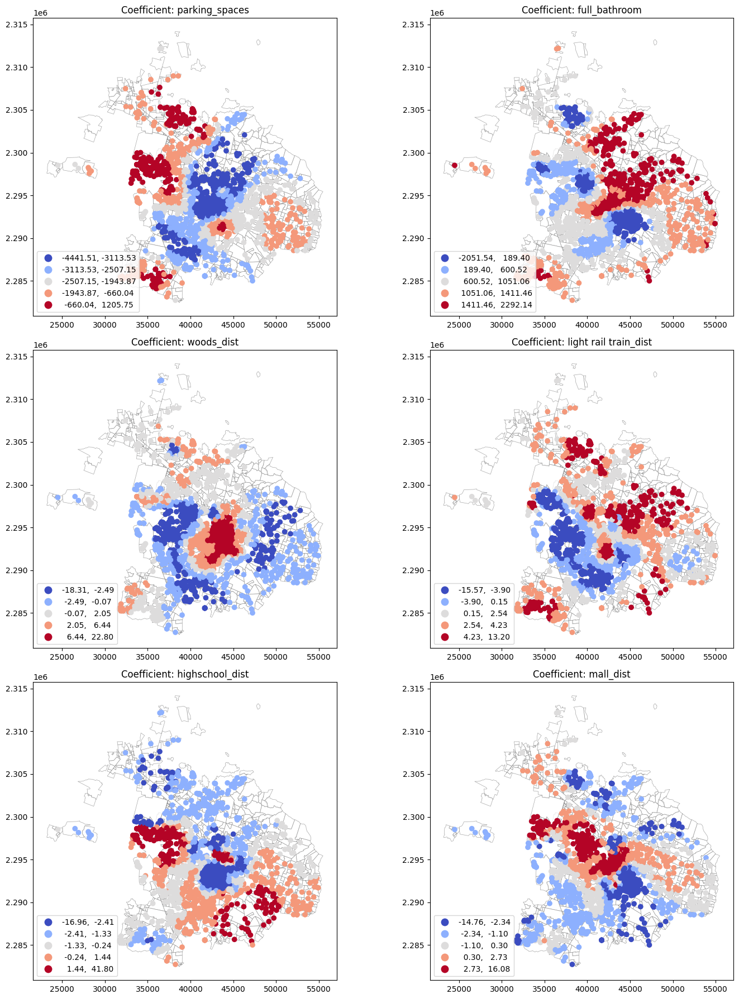

In [17]:
var_names = predictors + X_cols['dist']

fig, axes = plt.subplots(3, 2, figsize=(15, 18))
for i, var_idx in enumerate([1, 2, 7, 11, 22, 13]):  # Example indices
    ax = axes[i//2, i%2]
    # Plot base map
    gdf_neighborhoods.plot(
        ax=ax, color='white', edgecolor='gray', linewidth=0.5, alpha=0.7
    )
    gdf.plot(column=final_models['GWR_dist'].params[:, var_idx], 
             ax=ax, legend=True, 
             cmap='coolwarm', scheme='quantiles',
             legend_kwds={'loc': 'lower left'})
    ax.set_title(f"Coefficient: {var_names[var_idx]}")
plt.tight_layout()

In [13]:
for model_name, model in final_models.items():
    if 'XGB' not in model_name:
        print(f'## {model_name} #####\n')
        if 'GWR' in model_name:
            print(model.summary(), '\n\n')
        else:
            print(model.summary, '\n\n')

## OLS_within_500 #####

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :     dep_var                Number of Observations:        2925
Mean dependent var  :  44290.4772                Number of Variables   :          28
S.D. dependent var  :  18624.8651                Degrees of Freedom    :        2897
R-squared           :      0.4755
Adjusted R-squared  :      0.4706
Sum squared residual: 5.32042e+11                F-statistic           :     97.2552
Sigma-square        :183652634.133                Prob(F-statistic)     :           0
S.E. of regression  :   13551.850                Log likelihood        :  -31965.592
Sigma-square ML     :181894591.823                Akaike info criterion :   63987.184
S.E of regression ML:  13486.8303                Schwarz criterion     :   64154.653

---------------------------------

#### Additional plot for Spatial Cross Validation explanation

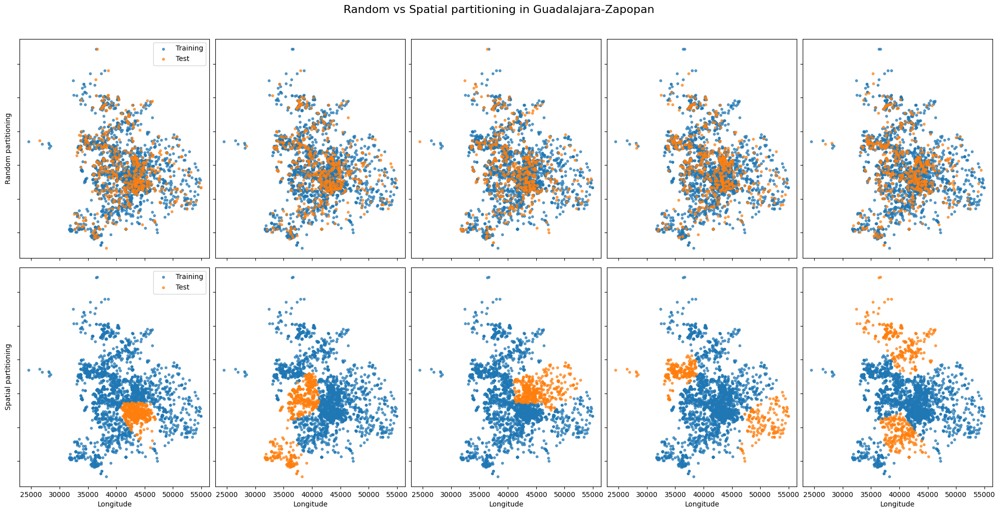

In [20]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import KFold, GroupKFold
from sklearn.cluster import KMeans

# Color scheme
train_color = '#1f77b4'  # Blue
test_color = '#ff7f0e'   # Orange

# Assuming 'gdf' is your GeoDataFrame
coords = np.vstack([gdf.centroid.x, gdf.centroid.y]).T
n_blocks = 10
blocks = KMeans(n_clusters=n_blocks).fit_predict(coords)

# Create the figure
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
fig.suptitle('Random vs Spatial partitioning in Guadalajara-Zapopan', fontsize=16, y=1.02)  # Increased y value

# Random CV (using regular KFold)
random_kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Plot random CV splits (top row)
for i, (train_idx, test_idx) in enumerate(random_kf.split(coords)):
    ax = axes[0, i]
    
    # Plot training points
    ax.scatter(coords[train_idx, 0], coords[train_idx, 1], 
               c=train_color, label='Training', s=10, alpha=0.7)
    # Plot test points
    ax.scatter(coords[test_idx, 0], coords[test_idx, 1], 
               c=test_color, label='Test', s=10, alpha=0.7)
    
    # Remove all x and y labels for top row
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    
    # Only add legend to first subplot
    if i == 0:
        ax.legend()

# Spatial CV (using your GroupKFold with KMeans blocks)
spatial_kf = GroupKFold(n_splits=5)

# Plot spatial CV splits (bottom row)
for i, (train_idx, test_idx) in enumerate(spatial_kf.split(coords, groups=blocks)):
    ax = axes[1, i]
    
    # Plot training points
    ax.scatter(coords[train_idx, 0], coords[train_idx, 1], 
               c=train_color, label='Training', s=10, alpha=0.7)
    # Plot test points
    ax.scatter(coords[test_idx, 0], coords[test_idx, 1], 
               c=test_color, label='Test', s=10, alpha=0.7)
    
    # Only add x-label for bottom row (all subplots)
    ax.set_xlabel('Longitude')
    # Remove y labels for all bottom row subplots
    ax.set_yticklabels([])
    
    # Only add legend to first subplot
    if i == 0:
        ax.legend()

# Add y-label for first column only
axes[0, 0].set_ylabel('Random partitioning')
axes[1, 0].set_ylabel('Spatial partitioning')

# Reduce space between subplots
plt.tight_layout(pad=1.0, w_pad=0.5, h_pad=1.0)
plt.show()